In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import plotly as plot
import time

In [2]:
file_path = r'D:\Desktop\electricity api\electricity_model\Short-term electricity load forecasting (Panama case study)\train_dataframes.xlsx'
xls = pd.ExcelFile(file_path)

sheet_names = xls.sheet_names
sheet_names

['Week 15, Apr 2019',
 'Week 21, May 2019',
 'Week 24, Jun 2019',
 'Week 29, Jul 2019',
 'Week 33, Aug 2019',
 'Week 37, Sep 2019',
 'Week 41, Oct 2019',
 'Week 44, Nov 2019',
 'Week 51, Dec 2019',
 'Week 01, Jan 2020',
 'Week 06, Feb 2020',
 'Week 10, Mar 2020',
 'Week 20, May 2020',
 'Week 24, Jun 2020']

In [3]:
week_data = pd.read_excel(file_path, sheet_name='Week 01, Jan 2020')
week_data.head()

,datetime,week_X-2,week_X-3,week_X-4,MA_X-4,dayOfWeek,weekend,holiday,Holiday_ID,hourOfDay,T2M_toc,DEMAND
0,2015-01-31 01:00:00,962.2865,906.9580,970.3450,938.004850,1,1,0,0,1,25.308496,954.2018
1,2015-01-31 02:00:00,933.3221,863.5135,912.1755,900.284075,1,1,0,0,2,25.141443,913.8660
2,2015-01-31 03:00:00,903.9817,848.4447,900.2688,881.704325,1,1,0,0,3,25.006738,903.3637
3,2015-01-31 04:00:00,900.9995,839.8821,889.9538,876.458825,1,1,0,0,4,24.899713,889.0806
4,2015-01-31 05:00:00,904.3481,847.1073,893.6865,879.190775,1,1,0,0,5,24.821558,910.1472


In [4]:
file_path = r'D:\Desktop\electricity api\electricity_model\Short-term electricity load forecasting (Panama case study)\continuous dataset.csv'
Train_data = pd.read_csv(file_path)
Train_data_demand_extract = pd.read_csv(file_path ,index_col=[0],parse_dates=[0])

In [5]:
Train_data.head()

,datetime,nat_demand,T2M_toc,QV2M_toc,TQL_toc,W2M_toc,T2M_san,QV2M_san,TQL_san,W2M_san,T2M_dav,QV2M_dav,TQL_dav,W2M_dav,Holiday_ID,holiday,school
0,2015-01-03 01:00:00,970.3450,25.865259,0.018576,0.016174,21.850546,23.482446,0.017272,0.001855,10.328949,22.662134,0.016562,0.096100,5.364148,0,0,0
1,2015-01-03 02:00:00,912.1755,25.899255,0.018653,0.016418,22.166944,23.399255,0.017265,0.001327,10.681517,22.578943,0.016509,0.087646,5.572471,0,0,0
2,2015-01-03 03:00:00,900.2688,25.937280,0.018768,0.015480,22.454911,23.343530,0.017211,0.001428,10.874924,22.531030,0.016479,0.078735,5.871184,0,0,0
3,2015-01-03 04:00:00,889.9538,25.957544,0.018890,0.016273,22.110481,23.238794,0.017128,0.002599,10.518620,22.512231,0.016487,0.068390,5.883621,0,0,0
4,2015-01-03 05:00:00,893.6865,25.973840,0.018981,0.017281,21.186089,23.075403,0.017059,0.001729,9.733589,22.481653,0.016456,0.064362,5.611724,0,0,0


In [6]:
Train_data.isna().sum()

datetime      0
nat_demand    0
T2M_toc       0
QV2M_toc      0
TQL_toc       0
W2M_toc       0
T2M_san       0
QV2M_san      0
TQL_san       0
W2M_san       0
T2M_dav       0
QV2M_dav      0
TQL_dav       0
W2M_dav       0
Holiday_ID    0
holiday       0
school        0
dtype: int64

In [7]:
import plotly.express as px
import pandas as pd

# Convert datetime column to datetime type
Train_data['datetime'] = pd.to_datetime(Train_data['datetime'])

# Create the plot using plotly
fig = px.line(Train_data, x="datetime", y="nat_demand", labels={"nat_demand": "Electricity Demand (MW)"}, 
              title="Electricity Demand Over Time")

# Update the layout for a better visual
fig.update_layout(
    xaxis_title="Date",
    yaxis_title="Electricity Demand (MW)",
    width=1000,  # Control the size of the figure
    height=400
)

# Show the plot
fig.show()

In [8]:
# Convert datetime column to datetime type
Train_data['datetime'] = pd.to_datetime(Train_data['datetime'])

# Tocumen city
fig_toc = px.line(Train_data, x="datetime", y="T2M_toc", labels={"T2M_toc": "Temperature (°C)"},
                  title="Temperature Over Time (Tocumen city)")
fig_toc.update_layout(xaxis_title="Date", yaxis_title="Temperature (°C)", width=1000, height=400)
fig_toc.show()

# Santiago city
fig_san = px.line(Train_data, x="datetime", y="T2M_san", labels={"T2M_san": "Temperature (°C)"},
                  title="Temperature Over Time (Santiago city)")
fig_san.update_layout(xaxis_title="Date", yaxis_title="Temperature (°C)", width=1000, height=400)
fig_san.show()

# David city
fig_dav = px.line(Train_data, x="datetime", y="T2M_dav", labels={"T2M_dav": "Temperature (°C)"},
                  title="Temperature Over Time (David city)")
fig_dav.update_layout(xaxis_title="Date", yaxis_title="Temperature (°C)", width=1000, height=400)
fig_dav.show()

In [9]:
Train_data_demand_extract.head()

,nat_demand,T2M_toc,QV2M_toc,TQL_toc,W2M_toc,T2M_san,QV2M_san,TQL_san,W2M_san,T2M_dav,QV2M_dav,TQL_dav,W2M_dav,Holiday_ID,holiday,school
datetime,,,,,,,,,,,,,,,,
2015-01-03 01:00:00,970.3450,25.865259,0.018576,0.016174,21.850546,23.482446,0.017272,0.001855,10.328949,22.662134,0.016562,0.096100,5.364148,0,0,0
2015-01-03 02:00:00,912.1755,25.899255,0.018653,0.016418,22.166944,23.399255,0.017265,0.001327,10.681517,22.578943,0.016509,0.087646,5.572471,0,0,0
2015-01-03 03:00:00,900.2688,25.937280,0.018768,0.015480,22.454911,23.343530,0.017211,0.001428,10.874924,22.531030,0.016479,0.078735,5.871184,0,0,0
2015-01-03 04:00:00,889.9538,25.957544,0.018890,0.016273,22.110481,23.238794,0.017128,0.002599,10.518620,22.512231,0.016487,0.068390,5.883621,0,0,0
2015-01-03 05:00:00,893.6865,25.973840,0.018981,0.017281,21.186089,23.075403,0.017059,0.001729,9.733589,22.481653,0.016456,0.064362,5.611724,0,0,0


In [10]:
Train_data_demand_extract.T2M_toc = Train_data_demand_extract.T2M_toc.astype(int)
Train_data_demand_extract.T2M_san = Train_data_demand_extract.T2M_san.astype(int)
Train_data_demand_extract.T2M_dav = Train_data_demand_extract.T2M_dav.astype(int)

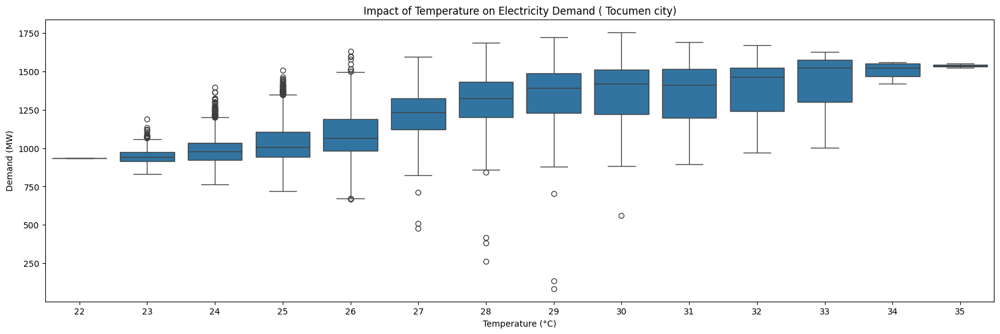

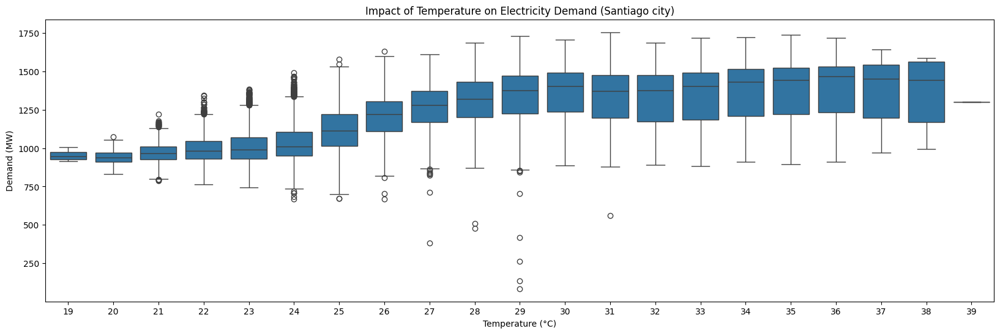

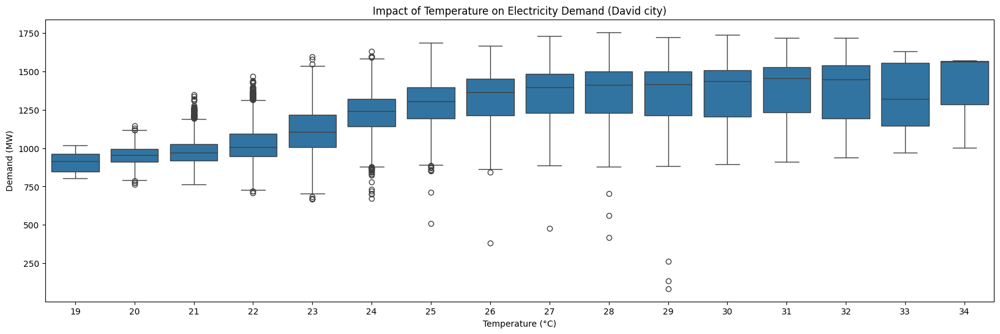

In [11]:
import matplotlib.pyplot as plt
# Impact of Temperature on Electricity Demand
plt.figure(figsize=(20, 6))
sns.boxplot(x='T2M_toc', y='nat_demand', data=Train_data_demand_extract)
plt.title('Impact of Temperature on Electricity Demand ( Tocumen city)')
plt.xlabel('Temperature (°C)')
plt.ylabel('Demand (MW)')
plt.show()

# Impact of Temperature on Electricity Demand
plt.figure(figsize=(20, 6))
sns.boxplot(x='T2M_san', y='nat_demand', data=Train_data_demand_extract)
plt.title('Impact of Temperature on Electricity Demand (Santiago city)')
plt.xlabel('Temperature (°C)')
plt.ylabel('Demand (MW)')
plt.show()

# Impact of Temperature on Electricity Demand
plt.figure(figsize=(20, 6))
sns.boxplot(x='T2M_dav', y='nat_demand', data=Train_data_demand_extract)
plt.title('Impact of Temperature on Electricity Demand (David city)')
plt.xlabel('Temperature (°C)')
plt.ylabel('Demand (MW)')
plt.show()


In [12]:
# Group the data by 'hourOfDay' and calculate the mean
avg_demand_by_hour = week_data.groupby('hourOfDay')['DEMAND'].mean().reset_index()

# Create the line plot using Plotly
fig = px.line(avg_demand_by_hour, x='hourOfDay', y='DEMAND', 
              title='Average Electricity Demand by Hour of the Day', 
              labels={'hourOfDay': 'Hour of the Day', 'DEMAND': 'Average Demand (MW)'})

# Update layout for better visual
fig.update_layout(width=1000, height=400)

# Show the plot
fig.show()

In [13]:
Train_data['datetime'] = pd.to_datetime(Train_data['datetime'])

# Set datetime as the index for resampling
Train_data.set_index('datetime', inplace=True)

# Resample the data to weekly mean based on 'nat_demand'
data_resampled = Train_data.resample('h').mean().reset_index()

In [14]:
data_resampled

,datetime,nat_demand,T2M_toc,QV2M_toc,TQL_toc,W2M_toc,T2M_san,QV2M_san,TQL_san,W2M_san,T2M_dav,QV2M_dav,TQL_dav,W2M_dav,Holiday_ID,holiday,school
0,2015-01-03 01:00:00,970.3450,25.865259,0.018576,0.016174,21.850546,23.482446,0.017272,0.001855,10.328949,22.662134,0.016562,0.096100,5.364148,0.0,0.0,0.0
1,2015-01-03 02:00:00,912.1755,25.899255,0.018653,0.016418,22.166944,23.399255,0.017265,0.001327,10.681517,22.578943,0.016509,0.087646,5.572471,0.0,0.0,0.0
2,2015-01-03 03:00:00,900.2688,25.937280,0.018768,0.015480,22.454911,23.343530,0.017211,0.001428,10.874924,22.531030,0.016479,0.078735,5.871184,0.0,0.0,0.0
3,2015-01-03 04:00:00,889.9538,25.957544,0.018890,0.016273,22.110481,23.238794,0.017128,0.002599,10.518620,22.512231,0.016487,0.068390,5.883621,0.0,0.0,0.0
4,2015-01-03 05:00:00,893.6865,25.973840,0.018981,0.017281,21.186089,23.075403,0.017059,0.001729,9.733589,22.481653,0.016456,0.064362,5.611724,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48043,2020-06-26 20:00:00,1128.5592,27.246545,0.020303,0.055511,9.289304,25.715295,0.019746,0.121552,1.990773,23.746545,0.018381,0.150879,2.444658,0.0,0.0,1.0
48044,2020-06-26 21:00:00,1112.7488,27.099573,0.020395,0.053848,9.837504,25.552698,0.019632,0.153870,2.094459,23.693323,0.018320,0.156311,2.515814,0.0,0.0,1.0
48045,2020-06-26 22:00:00,1081.5680,26.971155,0.020448,0.057251,10.262464,25.393030,0.019518,0.144531,2.396369,23.658655,0.018327,0.153259,2.800717,0.0,0.0,1.0
48046,2020-06-26 23:00:00,1041.6240,26.867487,0.020464,0.064178,10.326567,25.258112,0.019403,0.108063,2.720871,23.601862,0.018358,0.152771,3.138132,0.0,0.0,1.0


In [15]:

data_resampled['datetime'] = pd.to_datetime(data_resampled['datetime'])

# Extract hour, day, week, and month
data_resampled['hour'] = data_resampled['datetime'].dt.hour
data_resampled['day'] = data_resampled['datetime'].dt.day
data_resampled['month'] = data_resampled['datetime'].dt.month
data_resampled['hour_sin'] = np.sin(2 * np.pi * data_resampled['hour'] / 24)
data_resampled['hour_cos'] = np.cos(2 * np.pi * data_resampled['hour'] / 24)

In [16]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, GRU, Dense, Dropout, concatenate
from tensorflow.keras.metrics import RootMeanSquaredError
import matplotlib.pyplot as plt

In [17]:
start_time = time.time()  # Record start time

# Select the features and label
features = data_resampled[['month','hour','day','hour_sin','hour_cos','QV2M_toc', 'TQL_toc', 'W2M_toc', 'QV2M_san', 'TQL_san', 'W2M_san', 'QV2M_dav', 'TQL_dav', 'W2M_dav', 'T2M_toc', 'T2M_san', 'T2M_dav','holiday']]
labels = data_resampled['nat_demand']

# # Convert datetime to numerical values (e.g., timestamp)
# features = features.copy()  # To avoid SettingWithCopyWarning
# features['datetime'] = pd.to_datetime(features['datetime']).astype(np.int64) / 10**9

# # Handle missing values
# features = features.fillna(method='ffill')


In [18]:
features

,month,hour,day,hour_sin,hour_cos,QV2M_toc,TQL_toc,W2M_toc,QV2M_san,TQL_san,W2M_san,QV2M_dav,TQL_dav,W2M_dav,T2M_toc,T2M_san,T2M_dav,holiday
0,1,1,3,0.258819,0.965926,0.018576,0.016174,21.850546,0.017272,0.001855,10.328949,0.016562,0.096100,5.364148,25.865259,23.482446,22.662134,0.0
1,1,2,3,0.500000,0.866025,0.018653,0.016418,22.166944,0.017265,0.001327,10.681517,0.016509,0.087646,5.572471,25.899255,23.399255,22.578943,0.0
2,1,3,3,0.707107,0.707107,0.018768,0.015480,22.454911,0.017211,0.001428,10.874924,0.016479,0.078735,5.871184,25.937280,23.343530,22.531030,0.0
3,1,4,3,0.866025,0.500000,0.018890,0.016273,22.110481,0.017128,0.002599,10.518620,0.016487,0.068390,5.883621,25.957544,23.238794,22.512231,0.0
4,1,5,3,0.965926,0.258819,0.018981,0.017281,21.186089,0.017059,0.001729,9.733589,0.016456,0.064362,5.611724,25.973840,23.075403,22.481653,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48043,6,20,26,-0.866025,0.500000,0.020303,0.055511,9.289304,0.019746,0.121552,1.990773,0.018381,0.150879,2.444658,27.246545,25.715295,23.746545,0.0
48044,6,21,26,-0.707107,0.707107,0.020395,0.053848,9.837504,0.019632,0.153870,2.094459,0.018320,0.156311,2.515814,27.099573,25.552698,23.693323,0.0
48045,6,22,26,-0.500000,0.866025,0.020448,0.057251,10.262464,0.019518,0.144531,2.396369,0.018327,0.153259,2.800717,26.971155,25.393030,23.658655,0.0
48046,6,23,26,-0.258819,0.965926,0.020464,0.064178,10.326567,0.019403,0.108063,2.720871,0.018358,0.152771,3.138132,26.867487,25.258112,23.601862,0.0


In [19]:
# Scale the features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Prepare data for GRU model (3D shape: samples, timesteps, features)
# Assuming we are treating each row as a separate sample with 1 timestep
X = features_scaled.reshape(features_scaled.shape[0], 1, features_scaled.shape[1])
y = labels.values

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Build the GRU model
model = Sequential([
    GRU(64, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=False),
    Dropout(0.5),
    Dense(32, activation='relu'),
    Dropout(0.5),
    Dense(1)
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error', metrics=[RootMeanSquaredError()])

# Train the model
history = model.fit(X_train, y_train, epochs=200, validation_data=(X_test, y_test), batch_size=1440)

# Evaluate the model
loss, rmse = model.evaluate(X_test, y_test)
print(f'Test Loss (MSE): {loss}')
print(f'Test RMSE: {rmse}')

end_time = time.time()  # Record end time

elapsed_time = end_time - start_time
print(f"Elapsed time: {elapsed_time:.4f} seconds")

d:\Desktop\electricity api\.venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/200
24/24 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - loss: 1440462.5000 - root_mean_squared_error: 1200.1921 - val_loss: 1423905.1250 - val_root_mean_squared_error: 1193.2749
Epoch 2/200
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 1434359.7500 - root_mean_squared_error: 1197.6470 - val_loss: 1417667.7500 - val_root_mean_squared_error: 1190.6586
Epoch 3/200
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 1430008.7500 - root_mean_squared_error: 1195.8279 - val_loss: 1402529.8750 - val_root_mean_squared_error: 1184.2847
Epoch 4/200
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 1411999.0000 - root_mean_squared_error: 1188.2706 - val_loss: 1370105.0000 - val_root_mean_squared_error: 1170.5149
Epoch 5/200
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 1368746.8750 - root_mean_squared_error: 1169.9280 - val_loss: 1310460.0000 - val_root_mean_squared_error: 1144.7533
Epoch 6/200
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 1304492.8750 - root_mean_squared_error: 1142.1250 - val_loss

451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


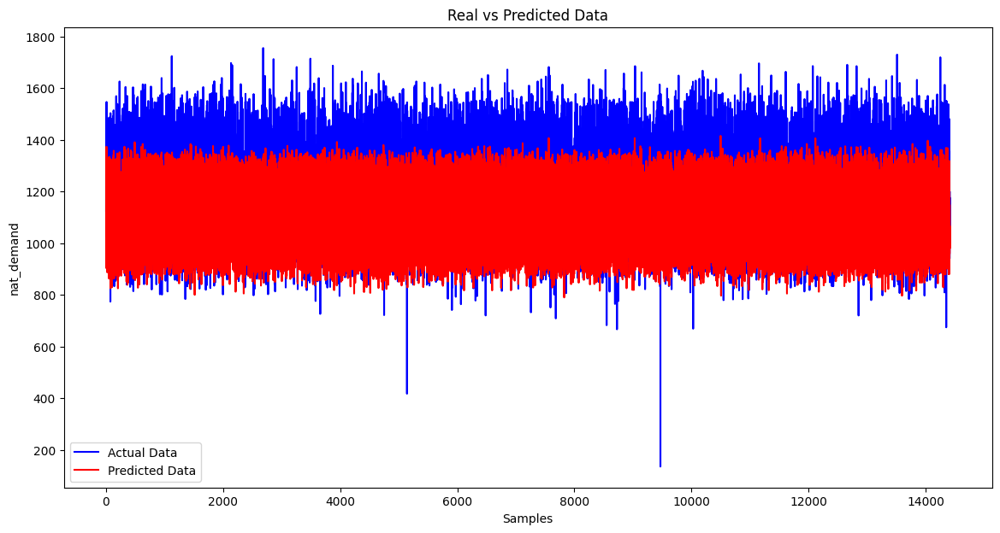

In [20]:
predictions = model.predict([X_test])
plt.figure(figsize=(14, 7))
plt.plot(y_test, color='blue', label='Actual Data')
plt.plot(predictions, color='red', label='Predicted Data')
plt.title('Real vs Predicted Data')
plt.xlabel('Samples')
plt.ylabel('nat_demand')
plt.legend()
plt.show()

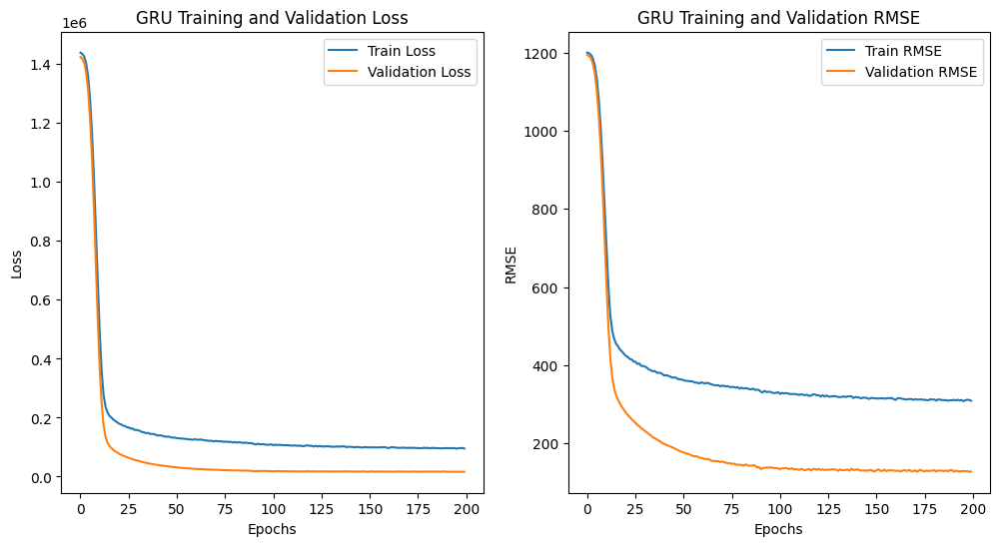

In [21]:
# Plot training and validation loss
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('GRU Training and Validation Loss')
plt.legend()

# Plot training and validation RMSE
plt.subplot(1, 2, 2)
plt.plot(history.history['root_mean_squared_error'], label='Train RMSE')
plt.plot(history.history['val_root_mean_squared_error'], label='Validation RMSE')
plt.xlabel('Epochs')
plt.ylabel('RMSE')
plt.title('GRU Training and Validation RMSE')
plt.legend()

plt.show()

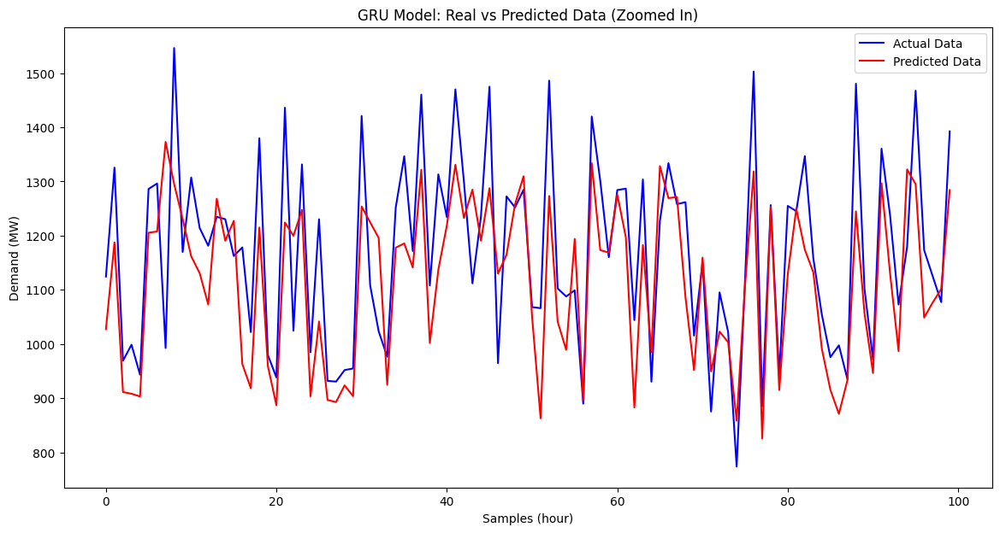

In [22]:
start_sample = 0
end_sample = 100

# Slice the test data and predictions
y_test_zoomed = y_test[start_sample:end_sample]
predictions_zoomed = predictions[start_sample:end_sample]

# Plot the zoomed-in data
plt.figure(figsize=(14, 7))
plt.plot(y_test_zoomed, color='blue', label='Actual Data')
plt.plot(predictions_zoomed, color='red', label='Predicted Data')
plt.title('GRU Model: Real vs Predicted Data (Zoomed In)')
plt.xlabel('Samples (hour)')
plt.ylabel('Demand (MW)')
plt.legend()
plt.show()

In [23]:
import pickle

# Save the trained model as a pickle file
model_filename = 'gru_model.pkl'
with open(model_filename, 'wb') as file:
    pickle.dump(model, file)

print(f"Model saved to {model_filename}")

Model saved to gru_model.pkl


In [24]:
import pickle
with open('scaler.pkl', 'wb') as file:
    pickle.dump(scaler, file)

In [25]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Assuming your features and target variables are prepared
X = Train_data.drop(columns=['nat_demand'])  # Replace with your actual target column
y = Train_data['nat_demand']  # Replace with your actual target column

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

ModuleNotFoundError: No module named 'xgboost'

In [63]:
xgb_model = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 0.3, learning_rate = 0.1,
                             max_depth = 5, alpha = 10, n_estimators = 300)

xgb_model.fit(X,y)

XGBRegressor(alpha=10, base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.3, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=300, n_jobs=None,
             num_parallel_tree=None, ...)

In [65]:
X

,T2M_toc,QV2M_toc,TQL_toc,W2M_toc,T2M_san,QV2M_san,TQL_san,W2M_san,T2M_dav,QV2M_dav,TQL_dav,W2M_dav,Holiday_ID,holiday,school
datetime,,,,,,,,,,,,,,,
2015-01-03 01:00:00,25.865259,0.018576,0.016174,21.850546,23.482446,0.017272,0.001855,10.328949,22.662134,0.016562,0.096100,5.364148,0,0,0
2015-01-03 02:00:00,25.899255,0.018653,0.016418,22.166944,23.399255,0.017265,0.001327,10.681517,22.578943,0.016509,0.087646,5.572471,0,0,0
2015-01-03 03:00:00,25.937280,0.018768,0.015480,22.454911,23.343530,0.017211,0.001428,10.874924,22.531030,0.016479,0.078735,5.871184,0,0,0
2015-01-03 04:00:00,25.957544,0.018890,0.016273,22.110481,23.238794,0.017128,0.002599,10.518620,22.512231,0.016487,0.068390,5.883621,0,0,0
2015-01-03 05:00:00,25.973840,0.018981,0.017281,21.186089,23.075403,0.017059,0.001729,9.733589,22.481653,0.016456,0.064362,5.611724,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-26 20:00:00,27.246545,0.020303,0.055511,9.289304,25.715295,0.019746,0.121552,1.990773,23.746545,0.018381,0.150879,2.444658,0,0,1
2020-06-26 21:00:00,27.099573,0.020395,0.053848,9.837504,25.552698,0.019632,0.153870,2.094459,23.693323,0.018320,0.156311,2.515814,0,0,1
2020-06-26 22:00:00,26.971155,0.020448,0.057251,10.262464,25.393030,0.019518,0.144531,2.396369,23.658655,0.018327,0.153259,2.800717,0,0,1


RMSE: 114.87707547493073
Loss (MSE): 13196.742469672934


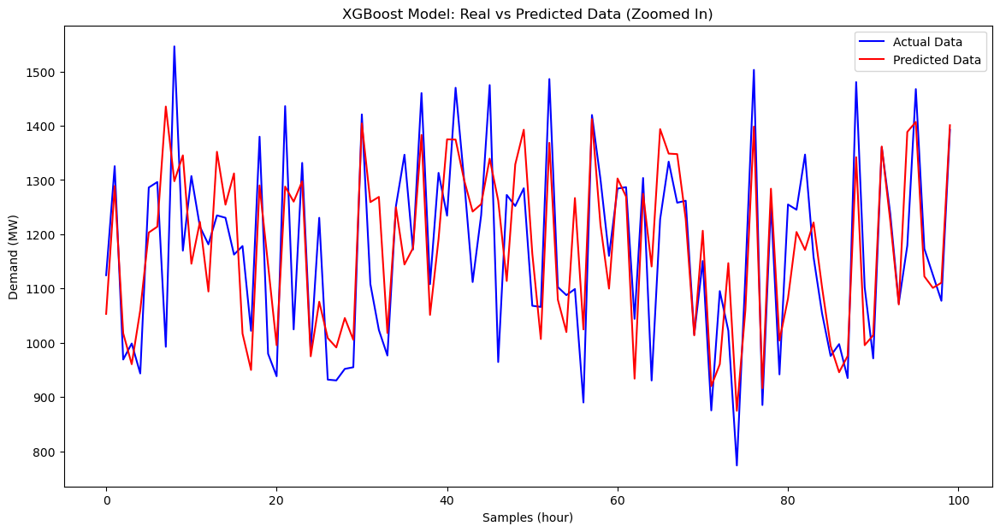

In [61]:
# Generate predictions using the trained XGBoost model
xgb_predictions = xgb_model.predict(X_test)

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test, xgb_predictions))

# Calculate Loss (MSE in this case)
loss = mean_squared_error(y_test, xgb_predictions)

# Print RMSE and Loss
print(f"RMSE: {rmse}")
print(f"Loss (MSE): {loss}")

# Define the sample range you want to zoom in on
start_sample = 0
end_sample = 100

# Slice the test data and predictions
y_test_zoomed = y_test.iloc[start_sample:end_sample]
xgb_predictions_zoomed = xgb_predictions[start_sample:end_sample]

# Plot the zoomed-in data
plt.figure(figsize=(14, 7))
plt.plot(y_test_zoomed.values, color='blue', label='Actual Data')
plt.plot(xgb_predictions_zoomed, color='red', label='Predicted Data')
plt.title('XGBoost Model: Real vs Predicted Data (Zoomed In)')
plt.xlabel('Samples (hour)')
plt.ylabel('Demand (MW)')
plt.legend()
plt.show()

In [64]:
import pickle

# Save the trained model as a pickle file
model_filename = 'xgb_model.pkl'
with open(model_filename, 'wb') as file:
    pickle.dump(xgb_model, file)

print(f"Model saved to {model_filename}")


Model saved to xgb_model.pkl
